In [1]:
# Standard libraries
import sys

# 3rd party libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay
import SimpleITK as sitk

# Our libraries
#sys.path.append('../../')
#from gui.gui_shared import auto_contrast

## Show correspondences

In [2]:
def remove_duplicates(list1: np.ndarray, list2: np.ndarray):
    """
    Remove duplicate elements from list1 and the corresponding elements from list2.
    
    Parameters:
    - list1: The first list from which duplicates will be removed.
    - list2: The second list from which elements will be removed corresponding to the removed elements in list1.
    
    Returns:
    - list1_unique: The list1 with duplicates removed.
    - list2_filtered: The list2 with elements removed corresponding to the removed elements in list1.
    """
    seen = set()
    list1_unique = []
    list2_filtered = []
    
    for item1, item2 in zip(list1, list2):
        item1_tuple = tuple(item1)
        if item1_tuple not in seen:
            seen.add(item1_tuple)
            list1_unique.append(item1)
            list2_filtered.append(item2)
    
    return np.array(list1_unique), np.array(list2_filtered)

Moving points shape: (790120, 3)
[[  1.  73. 216.]
 [  1.  73. 216.]
 [  1.  74. 216.]
 ...
 [526. 284. 271.]
 [526. 284. 272.]
 [526. 284. 272.]]

Fixed points shape: (790120, 3)
[[  1. 176. 230.]
 [  1. 177. 230.]
 [  1. 178. 231.]
 ...
 [526. 274. 261.]
 [526. 274. 262.]
 [526. 274. 263.]]

Turning moving points to a set, set size: 389967
Turning fixed points to a set, set size: 790120

Checking slice 350
Number of moving points for slice 350 : 2484
[[ 17 178]
 [ 17 179]
 [ 18 172]
 ...
 [271 355]
 [271 357]
 [271 357]]

Number of fixed points for slice 350 : 2484
[[ 10 173]
 [ 10 174]
 [ 10 175]
 ...
 [270 355]
 [270 356]
 [270 357]]

Number of unique moving points for slice 350 : 1326
[[ 17 178]
 [ 17 179]
 [ 18 172]
 ...
 [271 354]
 [271 355]
 [271 357]]

Number of unique fixed points for slice 350 : 1326
[[ 10 173]
 [ 10 174]
 [ 10 175]
 ...
 [270 354]
 [270 355]
 [270 356]]



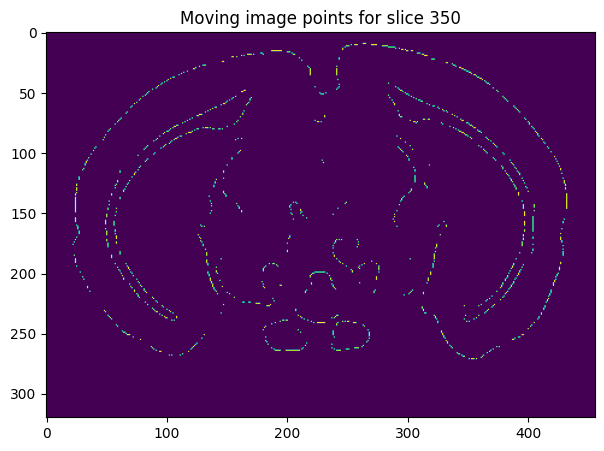

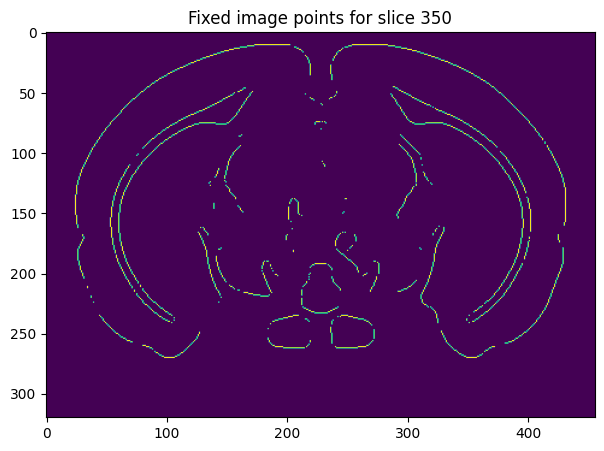

In [3]:
folder_name = "1_3i"

# Load in the moving and fixed points
mpoints_path = folder_name + "/mpoints.npy"
fpoints_path = folder_name + "/fpoints.npy"
mpoints = np.load(mpoints_path)
fpoints = np.load(fpoints_path)

# Print out the moving and fixed point information
print("Moving points shape:", mpoints.shape)
print(mpoints)
print("\nFixed points shape:", fpoints.shape)
print(fpoints)

# Turn the moving and fixed points into sets to remove duplicates
mpoints_set = set([tuple(p) for p in mpoints])
fpoints_set = set([tuple(p) for p in fpoints])
print("\nTurning moving points to a set, set size:", len(mpoints_set))
print("Turning fixed points to a set, set size:", len(fpoints_set))

# Rescaled height, width, and z
width = 456
height = 320
z = 528

# Create a binary image to show the correspondences
curr_idx = 350
print("\nChecking slice", curr_idx)

# Get relevant corresponding image points
curr_mpoints = np.array([point[1:] for point in mpoints if point[0] == curr_idx])
curr_mpoints = curr_mpoints.astype(int)
curr_fpoints = np.array([point[1:] for point in fpoints if point[0] == curr_idx])
curr_fpoints = curr_fpoints.astype(int)
print("Number of moving points for slice", curr_idx, ":", len(curr_mpoints))
print(curr_mpoints)
print("\nNumber of fixed points for slice", curr_idx, ":", len(curr_fpoints))
print(curr_fpoints)

curr_mpoints_unique, curr_fpoints_unique = remove_duplicates(curr_mpoints, curr_fpoints)
print("\nNumber of unique moving points for slice", curr_idx, ":", len(curr_mpoints_unique))
print(curr_mpoints_unique)
print("\nNumber of unique fixed points for slice", curr_idx, ":", len(curr_fpoints_unique))
print(curr_fpoints_unique)
print()

# Fill in binary image
binary_image_moving = np.zeros((height, width), dtype=bool)
binary_image_fixed = np.zeros((height, width), dtype=bool)
for point in curr_mpoints:
    binary_image_moving[point[0], point[1]] = 1
for point in curr_fpoints:
    binary_image_fixed[point[0], point[1]] = 1
    
# Show binary image
plt.figure(figsize=(10, 5))
plt.imshow(binary_image_moving, cmap='viridis')
plt.title('Moving image points for slice ' + str(curr_idx))
plt.show()

# Show binary image
plt.figure(figsize=(10, 5))
plt.imshow(binary_image_fixed, cmap='viridis')
plt.title('Fixed image points for slice ' + str(curr_idx))
plt.show()

### Plot Delauany triangulation
Code to validate Delaunay triangulations below

In [9]:
def circumcircle_det(triangle, point):
    C = triangle[0]
    B = triangle[1]
    A = triangle[2]
    D = point
    A_y, A_x = A
    B_y, B_x = B
    C_y, C_x = C
    D_y, D_x = D
    
    tri_mat = np.array([[A_x - D_x, A_y - D_y, (A_x - D_x)**2 + (A_y - D_y)**2],
                         [B_x - D_x, B_y - D_y, (B_x - D_x)**2 + (B_y - D_y)**2],
                         [C_x - D_x, C_y - D_y, (C_x - D_x)**2 + (C_y - D_y)**2]])
    return np.linalg.det(tri_mat)
    

def circumcircle(triangle):
    """
    Compute the circumcircle of a triangle.
    
    Parameters:
    - triangle: The vertices of the triangle.
    
    Returns:
    - center: The center of the circumcircle.
    - radius: The radius of the circumcircle.
    """
    A = triangle[0]
    B = triangle[1]
    C = triangle[2]
    
    D = 2 * (A[0] * (B[1] - C[1]) + B[0] * (C[1] - A[1]) + C[0] * (A[1] - B[1]))
    if D == 0:
        raise ValueError("Points are collinear.")
    
    Ux = ((A[0]**2 + A[1]**2) * (B[1] - C[1]) + (B[0]**2 + B[1]**2) * (C[1] - A[1]) + (C[0]**2 + C[1]**2) * (A[1] - B[1])) / D
    Uy = ((A[0]**2 + A[1]**2) * (C[0] - B[0]) + (B[0]**2 + B[1]**2) * (A[0] - C[0]) + (C[0]**2 + C[1]**2) * (B[0] - A[0])) / D
    
    center = np.array([Ux, Uy])
    radius = np.linalg.norm(center - A)
    
    print("triangle:", triangle)
    print("center", center)
    print("radius", radius)
    
    return center, radius


def check_circumcircle(points, triangulation, tolerance=1e-9, npy_path=True):
    """
    Check if a Delaunay triangulation is valid.
    
    Parameters:
    - points: The set of points used for the triangulation.
    - triangulation: The Delaunay triangulation object.
    
    Returns:
    - valid: True if the triangulation is valid, False otherwise.
    """
    valid = True
    num_failed = 0
    num_collinear = 0
    num_checks = 0
    failed_points = []  # Store failed points for debugging
    failed_triangles = []  # Store failed triangles for debugging
    collinear_list = []  # Store collinear triangles for debugging
    
    # Loop through each triangle in the triangulation
    for simplex in triangulation.simplices:
        triangle = points[simplex]
        
        # Skip if triangle is not valid
        try:
            center, radius = circumcircle(triangle)
        except ValueError as e:
            if num_collinear == 0:
                print(f"{e}, skipping triangle due to collinearity:", ", ".join(map(str, triangle)))
            num_collinear += 1
            collinear_list.append(triangle)
            continue
        
        # Check if all points are outside the circumcircle
        for point in points:
            num_checks += 1
            
            det = circumcircle_det(triangle, point)
            print("\tDeterminant:", det)
                    
            if np.any(np.all(point == triangle, axis=1)):
                continue
            
            # If point is inside the circumcircle
            if np.linalg.norm(point - center) < radius - tolerance:
                print("Failed")
                
                if num_failed == 0:  # Print the first time
                    print("Circumcircle check failed for")
                    print("\tTolerance:", tolerance)
                    print("\tSimplex:", simplex)
                    print("\tTriangle:", ", ".join(map(str, triangle)))
                    print("\tCircumcircle center:", center)
                    print("\tCircumcircle radius:", radius)
                    print("\tCheck failed on Point:", point)
                    print(f"\tDistance to circumcircle center ({np.linalg.norm(point - center)}) was less than radius ({radius - tolerance}).")
                    print("...")
                    
                    
                valid = False
                num_failed += 1
                failed_points.append(point)
                failed_triangles.append(triangle)
                
                #return False
    print("Number of failed circumcircle checks:", num_failed, "/", num_checks)
    print("Number of collinear checks:", num_collinear)
    if npy_path is not None:
        np.save("failed_points.npy", failed_points)
        np.save("failed_triangles.npy", failed_triangles)
        np.save("collinear_triangles.npy", collinear_list)
    return valid


def do_lines_intersect(p1, q1, p2, q2):
    """
    Check if two line segments (p1, q1) and (p2, q2) intersect.
    
    Parameters:
    - p1, q1: Endpoints of the first line segment.
    - p2, q2: Endpoints of the second line segment.
    
    Returns:
    - intersect: True if the line segments intersect, False otherwise.
    """
    def orientation(p, q, r):
        val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
        if val == 0:
            return 0
        return 1 if val > 0 else 2

    def on_segment(p, q, r):
        if min(p[0], r[0]) <= q[0] <= max(p[0], r[0]) and min(p[1], r[1]) <= q[1] <= max(p[1], r[1]):
            return True
        return False

    o1 = orientation(p1, q1, p2)
    o2 = orientation(p1, q1, q2)
    o3 = orientation(p2, q2, p1)
    o4 = orientation(p2, q2, q1)

    if o1 != o2 and o3 != o4:
        return True

    if o1 == 0 and on_segment(p1, p2, q1):
        return True
    if o2 == 0 and on_segment(p1, q2, q1):
        return True
    if o3 == 0 and on_segment(p2, p1, q2):
        return True
    if o4 == 0 and on_segment(p2, q1, q2):
        return True

    return False


def triangles_overlap(tri1, tri2):
    """
    Check if two triangles overlap by checking if any of their edges intersect,
    excluding shared edges or vertices.
    
    Parameters:
    - tri1: The vertices of the first triangle.
    - tri2: The vertices of the second triangle.
    
    Returns:
    - overlap: True if the triangles overlap, False otherwise.
    """
    edges1 = [(tri1[i], tri1[(i + 1) % 3]) for i in range(3)]
    edges2 = [(tri2[i], tri2[(i + 1) % 3]) for i in range(3)]
    
    for edge1 in edges1:
        for edge2 in edges2:
            if do_lines_intersect(edge1[0], edge1[1], edge2[0], edge2[1]):
                # Check if the edges are not shared
                if not (np.array_equal(edge1[0], edge2[0]) or np.array_equal(edge1[0], edge2[1]) or
                        np.array_equal(edge1[1], edge2[0]) or np.array_equal(edge1[1], edge2[1])):
                    return True
    return False


def check_overlapping_triangles(points, triangulation, npy_path="overlapping_triangles.npy"):
    """
    Check if a Delaunay triangulation has overlapping triangles.
    
    Parameters:
    - points: The set of points used for the triangulation.
    - triangulation: The Delaunay triangulation object.
    
    Returns:
    - overlap: True if there are overlapping triangles, False otherwise.
    """
    num_overlapping_triangles = 0
    num_checks = 0
    overlap = False
    overlapping_triangles = []  # Store overlapping triangles for debugging
    
    # Check for overlapping triangles
    for i, simplex1 in enumerate(triangulation.simplices):
        tri1 = points[simplex1]
        for j, simplex2 in enumerate(triangulation.simplices):
            if i >= j:
                continue
            tri2 = points[simplex2]
            # If triangles overlap, increment the count
            num_checks += 1
            if triangles_overlap(tri1, tri2):
                if num_overlapping_triangles == 0:  # Print the first time
                    tri1_str = ", ".join(map(str, tri1))
                    tri2_str = ", ".join(map(str, tri2))
                    print(f"\tTriangles overlap on triangle {tri1_str} and triangle {tri2_str}.")
                    print("...")
                overlapping_triangles.append((tri1, tri2))
                overlap = True
                num_overlapping_triangles += 1
                
                #return True
    print("Number of overlapping triangles:", num_overlapping_triangles, "/", num_checks)
    if npy_path is not None:
        np.save(npy_path, overlapping_triangles)
    return overlap



def validate_delaunay(points, tri):
    """
    Validate a Delaunay triangulation.
    
    Parameters:
    - points: The set of points used for the triangulation.
    
    Returns:
    - valid: True if the triangulation is valid, False otherwise.
    """
    valid = True
    # 1. Check circumcircle property
    print("Checking circumcircle...")
    if not check_circumcircle(points, tri):
        print("\tCircumcircle check failed.")
        valid = False
    else:
        print("\tCircumcircle check passed.")
        
    # 2. Check for overlapping triangles
    print("Checking for no overlapping triangles...")
    if check_overlapping_triangles(points, tri):
        print("\tOverlapping triangles check failed.")
        valid = False
    else:
        print("\tOverlapping triangles check passed.")
        
    # A summary of the validation
    if valid:
        print("All checks passed.")
    else:
        print("At least one check failed.")
    return valid

Try an example Delaunay triangulation where I swap some indexes around

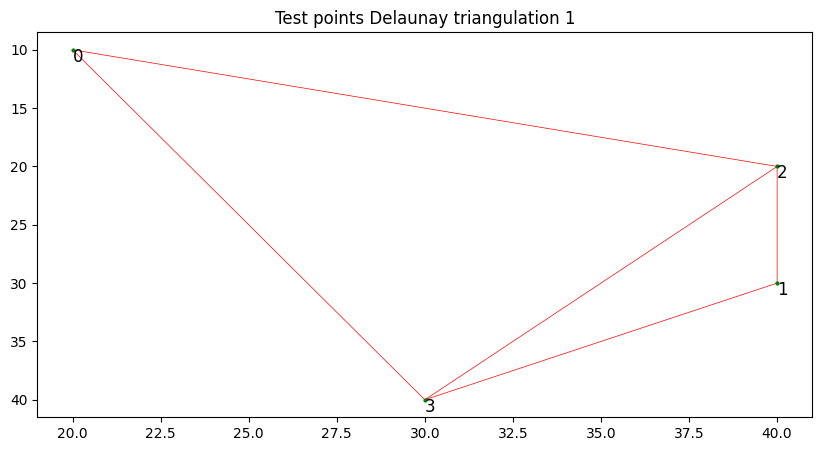

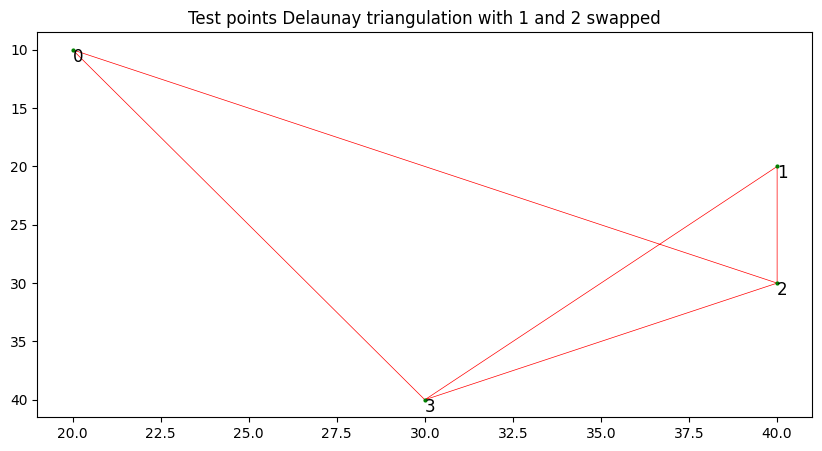

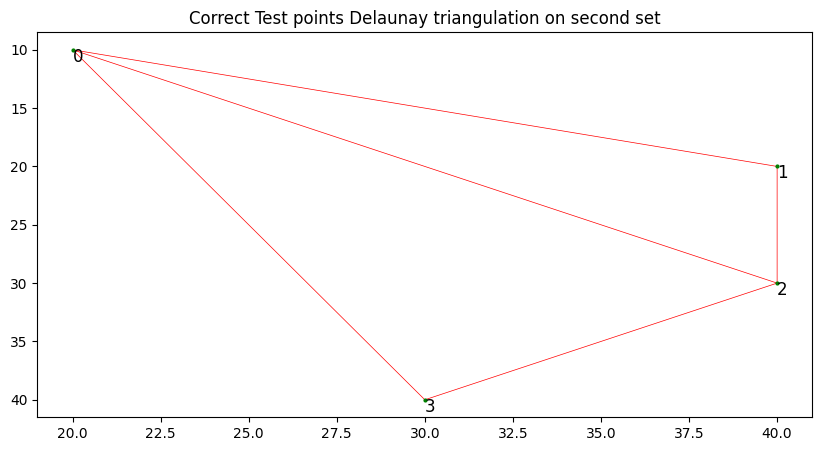

In [20]:
from matplotlib.patches import Circle


test_pts = np.array([
    [10, 20],  # 0
    [30, 40],  # 1
    [20, 40],  # 2
    [40, 30]]) # 3

triang = Delaunay(test_pts)

plt.figure(figsize=(10, 5))
plt.plot(test_pts[:, 1], test_pts[:, 0], 'go', markersize=2)
for i in range(len(test_pts)):
    pt = test_pts[i]
    plt.text(pt[1], pt[0] + 1, str(i), fontsize=12)
plt.triplot(test_pts[:, 1], test_pts[:, 0], triang.simplices, color='red', linewidth=0.5)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Test points Delaunay triangulation 1')
#circle = Circle(center, radius, color='blue', fill=False, linewidth=1.5)
#plt.gca().add_patch(circle)
plt.show()

# Swap 1 and 2 around
test_pts_2 = np.array([
    test_pts[0],
    test_pts[2],
    test_pts[1],  # 1
    test_pts[3]]) # 3

plt.figure(figsize=(10, 5))
plt.plot(test_pts_2[:, 1], test_pts_2[:, 0], 'go', markersize=2)
for i in range(len(test_pts_2)):
    pt = test_pts_2[i]
    plt.text(pt[1], pt[0] + 1, str(i), fontsize=12)
plt.triplot(test_pts_2[:, 1], test_pts_2[:, 0], triang.simplices, color='red', linewidth=0.5)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Test points Delaunay triangulation with 1 and 2 swapped')
# Plot circumcircle
#center = (25, 25)
#radius = 15.811388300841896
#circle = Circle(center, radius, color='blue', fill=False, linewidth=1.5)
#plt.gca().add_patch(circle)
plt.show()


triang_2 = Delaunay(test_pts_2)
plt.figure(figsize=(10, 5))
plt.plot(test_pts_2[:, 1], test_pts_2[:, 0], 'go', markersize=2)
for i in range(len(test_pts_2)):
    pt = test_pts_2[i]
    plt.text(pt[1], pt[0] + 1, str(i), fontsize=12)
plt.triplot(test_pts_2[:, 1], test_pts_2[:, 0], triang_2.simplices, color='red', linewidth=0.5)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Correct Test points Delaunay triangulation on second set')
plt.show()

In [18]:
# Validate the Delaunay triangulation
print("Checking test point set 1 triangulation (expected to pass)...")
_ = validate_delaunay(test_pts, triang)
print()
print("Checking test point set 1 triangulation on test point set 2 (expected to fail)...")
_ = validate_delaunay(test_pts_2, triang)
print()
print("Checking test point set 2 triangulation (expected to pass)...")
_ = validate_delaunay(test_pts_2, triang_2)

Checking test point set 1 triangulation (expected to pass)...
Checking circumcircle...
triangle: [[30 40]
 [20 40]
 [40 30]]
center [25. 25.]
radius 15.811388300841896
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
triangle: [[40 30]
 [20 40]
 [10 20]]
center [25. 25.]
radius 15.811388300841896
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
Number of failed circumcircle checks: 0 / 8
Number of collinear checks: 0
	Circumcircle check passed.
Checking for no overlapping triangles...
Number of overlapping triangles: 0 / 1
	Overlapping triangles check passed.
All checks passed.

Checking test point set 1 triangulation on test point set 2 (expected to fail)...
Checking circumcircle...
triangle: [[20 40]
 [30 40]
 [40 30]]
center [25. 25.]
radius 15.811388300841896
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
	Determinant: 0.0
triangle: [[40 30]
 [30 40]
 [10 20]]
center [25. 25.]
radius 15.811388300841896
	Determinant: 0.0
	Determin

### Perform Delaunay triangulation on all unfiltered moving points and show the triangulation

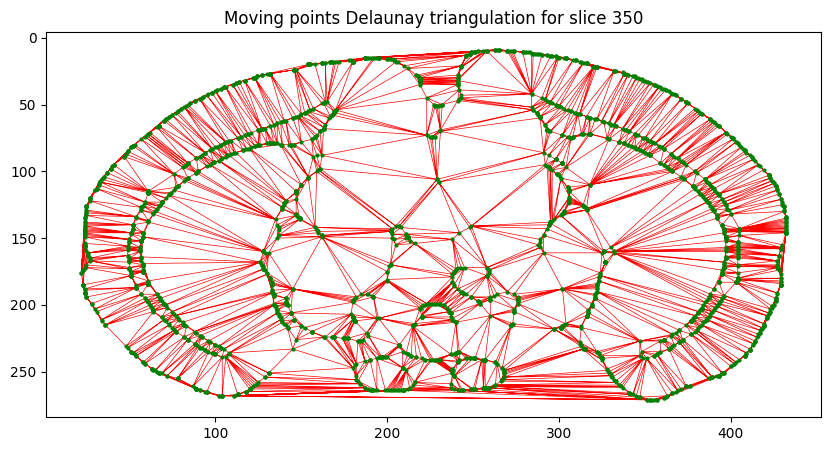

In [34]:
curr_points = curr_mpoints  # The set of points to triangulate on
# Do triangulation on moving points and show it on moving points
tri = Delaunay(curr_points)

# Plot the Delaunay triangulation
plt.figure(figsize=(10, 5))
plt.triplot(tri.points[:, 1], tri.points[:, 0], tri.simplices, color='red', linewidth=0.5)
plt.plot(tri.points[:, 1], tri.points[:, 0], 'go', markersize=2)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Moving points Delaunay triangulation for slice ' + str(curr_idx))
plt.show()

In [22]:
# Validate the Delaunay triangulation
print("Checking moving points Delaunay triangulation...")
_ = validate_delaunay(curr_points, tri)
print()

Checking moving points Delaunay triangulation...
Checking circumcircle...
Number of failed circumcircle checks: 0 / 6314328
Number of collinear checks: 0
	Circumcircle check passed.
Checking for no overlapping triangles...
Number of overlapping triangles: 0 / 3229611
	Overlapping triangles check passed.
All checks passed.



In [24]:
len(tri.coplanar)  # Points exluded from triangulation becaues they are coplanar

1158

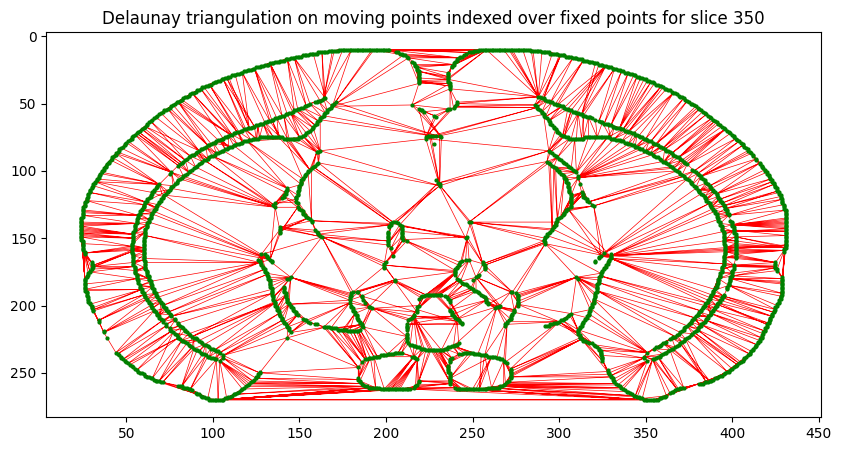

In [35]:
# Do triangulation on moving points and show it on fixed points
plt.figure(figsize=(10, 5))
plt.triplot(curr_fpoints[:, 1], curr_fpoints[:, 0], tri.simplices, color='red', linewidth=0.5)
plt.plot(curr_fpoints[:, 1], curr_fpoints[:, 0], 'go', markersize=2)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Delaunay triangulation on moving points indexed over fixed points for slice ' + str(curr_idx))
plt.show()

In [36]:
# Validate the Delaunay triangulation
print("Checking moving points Delaunay triangulation over fixed points...")
_ = validate_delaunay(curr_fpoints, tri)
print()

Checking moving points Delaunay triangulation over fixed points...
Checking circumcircle...
Failed
[[  135     8 18289]
 [ -109     8 11945]
 [   -1     0     1]]
	Determinant: 52703.999999999985
Circumcircle check failed for
	Tolerance: 1e-09
	Simplex: [2404 2473 2475]
	Triangle: [262 213], [270 105], [270 349]
	Circumcircle center: [1184.  227.]
	Circumcircle radius: 922.1062845464182
	Check failed on Point: [262 214]
	Distance to circumcircle center (922.0916440354505) was less than radius (922.1062845454182).
...
Failed
[[  243     0 59049]
 [   -1     0     1]
 [  107    -8 11513]]
	Determinant: 474336.0000000002
Failed
[[  135     8 18289]
 [   -1     0     1]
 [   27     0   729]]
	Determinant: 6048.000000000004
Failed
[[  243     0 59049]
 [  107    -8 11513]
 [  135    -8 18289]]
	Determinant: 54431.99999999291
Failed
[[ 2  3 13]
 [-1 -2  5]
 [ 1  1  2]]
	Determinant: 15.999999999999998
Failed
[[ 1  1  2]
 [-2 -4 20]
 [ 0 -1  1]]
	Determinant: 22.000000000000004
Failed
[[ 0 -1

### Do triangulation on unique points

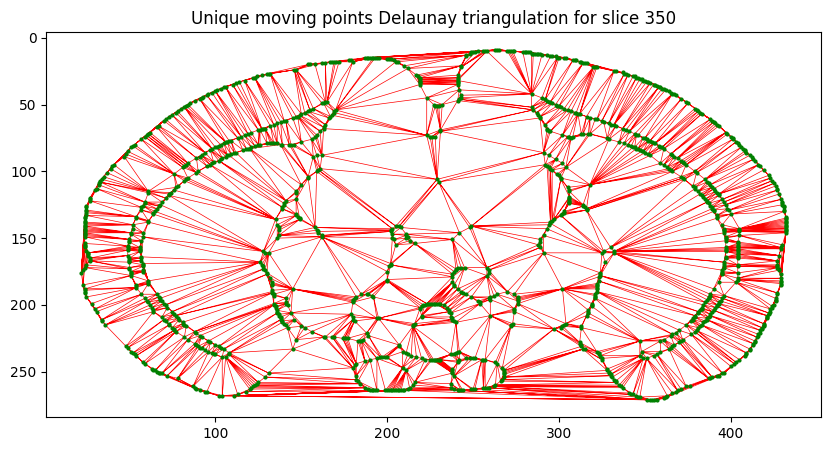

In [29]:
curr_points = curr_mpoints_unique  # The set of points to triangulate on

# Do triangulation on moving points and show it on moving points
tri_m_unique = Delaunay(curr_points)

# Plot the Delaunay triangulation
plt.figure(figsize=(10, 5))
plt.triplot(tri_m_unique.points[:, 1], tri_m_unique.points[:, 0], tri_m_unique.simplices, color='red', linewidth=0.5)
plt.plot(tri_m_unique.points[:, 1], tri_m_unique.points[:, 0], 'go', markersize=2)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Unique moving points Delaunay triangulation for slice ' + str(curr_idx))
plt.show()

In [30]:
_ = validate_delaunay(curr_mpoints_unique, tri_m_unique)

Checking circumcircle...
Number of failed circumcircle checks: 0 / 3370692
Number of collinear checks: 0
	Circumcircle check passed.
Checking for no overlapping triangles...
Number of overlapping triangles: 0 / 3229611
	Overlapping triangles check passed.
All checks passed.


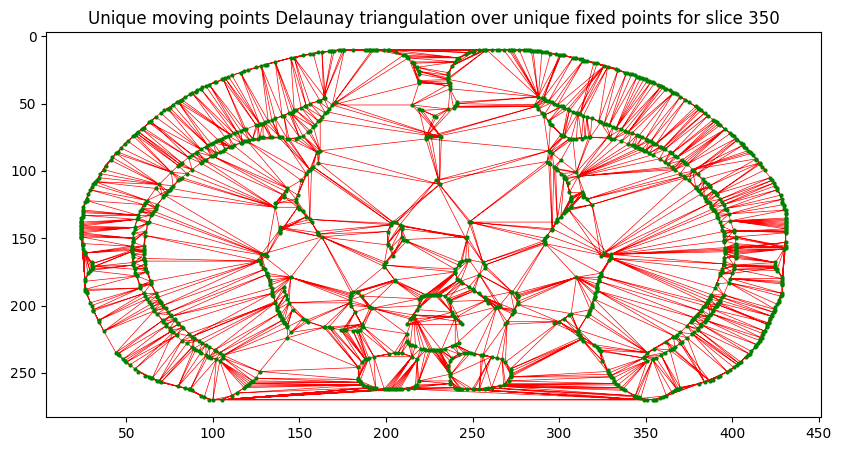

In [31]:
# Plot the Delaunay triangulation
plt.figure(figsize=(10, 5))
plt.triplot(curr_fpoints_unique[:, 1], curr_fpoints_unique[:, 0], tri_m_unique.simplices, color='red', linewidth=0.5)
plt.plot(curr_fpoints_unique[:, 1], curr_fpoints_unique[:, 0], 'go', markersize=2)
plt.gca().invert_yaxis()  # Invert the y-axis
plt.title('Unique moving points Delaunay triangulation over unique fixed points for slice ' + str(curr_idx))
plt.show()

In [32]:
_ = validate_delaunay(curr_fpoints, tri_m_unique)

Checking circumcircle...
Circumcircle check failed for
	Tolerance: 1e-09
	Simplex: [1207 1212 1222]
	Triangle: [146 139], [146 395], [147 395]
	Circumcircle center: [146.5 267. ]
	Circumcircle radius: 128.00097655877474
	Check failed on Point: [ 22 238]
	Distance to circumcircle center (127.83289873893966) was less than radius (128.00097655777475).
...
Points are collinear., skipping triangle due to collinearity: [159 402], [159 396], [159 430]
Number of failed circumcircle checks: 2614844 / 5807592
Number of collinear checks: 204
	Circumcircle check failed.
Checking for no overlapping triangles...
	Triangles overlap on triangle [146 139], [146 395], [147 395] and triangle [153  54], [149 292], [139  62].
...
Number of overlapping triangles: 178696 / 3229611
	Overlapping triangles check failed.
At least one check failed.
